# Removing Noise
This script shows the different trials that led to perform the following preprocessing steps:

Take the image from a folder and apply to it:
  - Median filtering 
  - Bilateral filtering

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
cd images_to_denoise

[WinError 2] Impossibile trovare il file specificato: 'images_to_denoise'
l:\Il mio Drive\Assignment\nnnewNONOISE_dataset\Rationale_Behind_Preprocessing\images_to_denoise


## Filtering

In [ ]:
def pre_process_image(original_img, gaussian_filtering=False, median_filtering=False ,show_image=True, apply_bilateral= False, sharpen_image=False, fontsize=10, figsize=8):

    # convert to grayscale
    img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
    
    if median_filtering:
        # apply median filtering
        img = cv2.medianBlur(img, 5)
    
    # apply bilateral filtering
    if apply_bilateral:
        # the input of bilateral filter is the image, diameter of each pixel neighborhood, sigmaColor, sigmaSpace
        # their meaning is: 
        # diameter of each pixel neighborhood - how large the area of each pixel is considered when filtering
        # sigmaColor - how large the color range is considered when filtering
        # sigmaSpace - how large the distance range is considered when filtering
        
        img = cv2.bilateralFilter(img, 15, 2, 2)
    
    
    if gaussian_filtering:
        # apply gaussian blur
        img = cv2.GaussianBlur(img, (3, 3), 0)
    
    preprocessed_img = img

    if sharpen_image:
        # sharpen image
        kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
        preprocessed_img = cv2.filter2D(preprocessed_img, -1, kernel)

    if show_image:
        # show original image alongside preprocessed image
        fig, ax = plt.subplots(1, 2, figsize=(figsize, figsize))
        ax[0].imshow(original_img)
        ax[0].set_title('Original Image', fontsize=fontsize)
        ax[1].imshow(preprocessed_img, cmap='gray')
        # Compose a string to show which transformations were applied
        transformation_string =  ''
        if apply_bilateral:
            transformation_string += 'Bilateral Filtering, '
        if median_filtering:
            transformation_string += 'Median Filtering, '
        if gaussian_filtering:
            transformation_string += 'Gaussian Filtering, '
        if sharpen_image:
            transformation_string += 'Sharpening, '
        transformation_string = transformation_string[:-2]
        ax[1].set_title('Preprocessed Image\n' + transformation_string, fontsize=fontsize)
        
    return preprocessed_img


In [ ]:

# This function is used to show the effect of different preprocessing techniques on the same image all the possible combinations of preprocessing techniques are shown
def show_preprocessing_effect(original_img, fontsize=10, figsize=8):
    fig, ax = plt.subplots(3, 3, figsize=(figsize, figsize))
    fig.suptitle('Preprocessing Effects', fontsize=fontsize)
    ax[0,0].imshow(original_img)
    ax[0,0].set_title('Original Image', fontsize=fontsize)
    ax[0,1].imshow(pre_process_image(original_img, apply_bilateral=True, gaussian_filtering=False, median_filtering=False ,show_image=False,  sharpen_image=False), cmap='gray')
    ax[0,1].set_title('Bilateral Filtering', fontsize=fontsize)
    ax[0,2].imshow(pre_process_image(original_img, apply_bilateral=False, gaussian_filtering=True, median_filtering=False ,show_image=False,  sharpen_image=False), cmap='gray')
    ax[0,2].set_title('Gaussian Filtering', fontsize=fontsize)
    ax[1,0].imshow(pre_process_image(original_img, apply_bilateral=False, gaussian_filtering=False, median_filtering=True ,show_image=False,  sharpen_image=False), cmap='gray')
    ax[1,0].set_title('Median Filtering', fontsize=fontsize)
    ax[1,1].imshow(pre_process_image(original_img, apply_bilateral=True, gaussian_filtering=True, median_filtering=False ,show_image=False,  sharpen_image=False), cmap='gray')
    ax[1,1].set_title('Bilateral + Gaussian Filtering', fontsize=fontsize)
    ax[1,2].imshow(pre_process_image(original_img, apply_bilateral=True, gaussian_filtering=False, median_filtering=True ,show_image=False,  sharpen_image=False), cmap='gray')
    ax[1,2].set_title('Bilateral + Median Filtering', fontsize=fontsize)
    ax[2,0].imshow(pre_process_image(original_img, apply_bilateral=False, gaussian_filtering=True, median_filtering=True ,show_image=False,  sharpen_image=False), cmap='gray')
    ax[2,0].set_title('Gaussian + Median Filtering', fontsize=fontsize)
    ax[2,1].imshow(pre_process_image(original_img, apply_bilateral=True, gaussian_filtering=True, median_filtering=True ,show_image=False,  sharpen_image=False), cmap='gray')
    ax[2,1].set_title('Bilateral + Gaussian + Median Filtering', fontsize=fontsize)
    ax[2,2].imshow(pre_process_image(original_img, apply_bilateral=True, gaussian_filtering=False, median_filtering=True ,show_image=False,  sharpen_image=True), cmap='gray')
    ax[2,2].set_title('Bilateral + Median Filtering + Sharpening', fontsize=fontsize)


In [ ]:
# This function allows to show the effect of different bilateral filter parameters on the same image, a total of 9 different combinations are shown
def show_bilateral_filtering_effect(original_img, median_filtering=True, fontsize=10, figsize=8):
    # this is the image to apply bilateral filtering on
    starting_image = pre_process_image(original_img, apply_bilateral=True, gaussian_filtering=False, median_filtering=median_filtering)
    fig, ax = plt.subplots(3, 3, figsize=(figsize, figsize))
    fig.suptitle('Bilateral Filtering Effects', fontsize=fontsize)
    # Bilteral filtering are parametrized by d, sC, sS
    # d is the diameter of each pixel neighborhood fixed to 3
    # sC is the color range everytime it increases by a factor of 2 the image becomes more blurred
    # sS is the space range everytime it increases by a factor of 2 the image becomes more blurred
    d = 15
    sC = 1
    sS = 1
    k=1
    j=1
    for i in range(9):
        if i%3 == 0 and i != 0:
            k+=1
            j=1
        ax[k-1,j-1].imshow(cv2.bilateralFilter(starting_image, d, sC, sS), cmap='gray')
        ax[k-1,j-1].set_title('d=' + str(d) + ', sC=' + str(sC) + ', sS=' + str(sS), fontsize=fontsize)
        sC*=2
        sS*=2
        j+=1
    

# First Image

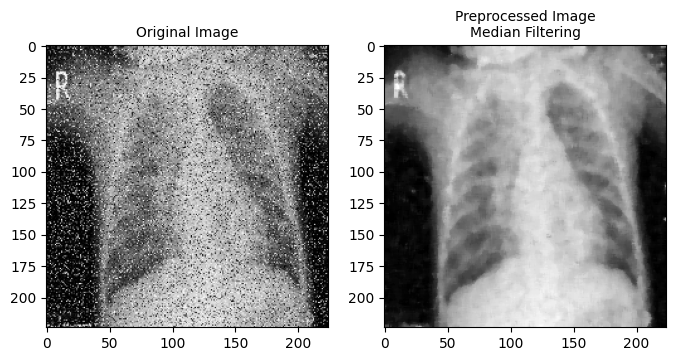

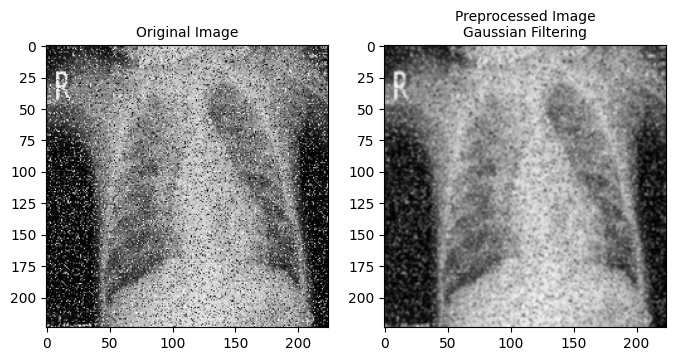

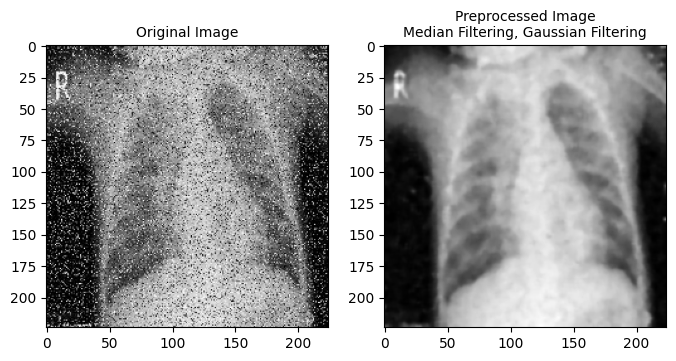

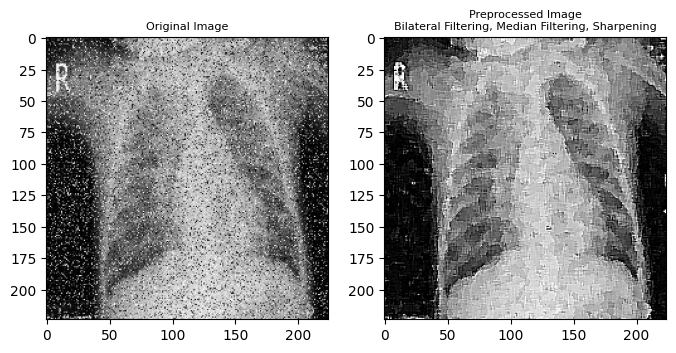

In [ ]:
# Read in the image elimina_subito.jpeg
testing_image = cv2.imread('subito1.jpeg')
# test preprocessing

_=pre_process_image(testing_image, median_filtering= True)
_=pre_process_image(testing_image, gaussian_filtering= True)
_=pre_process_image(testing_image, gaussian_filtering= True, median_filtering= True)
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True, sharpen_image=True, fontsize=8)


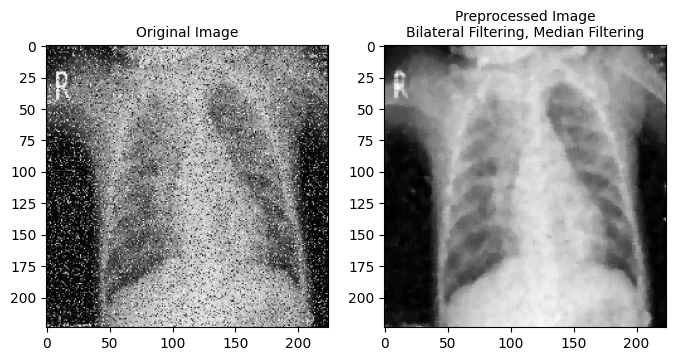

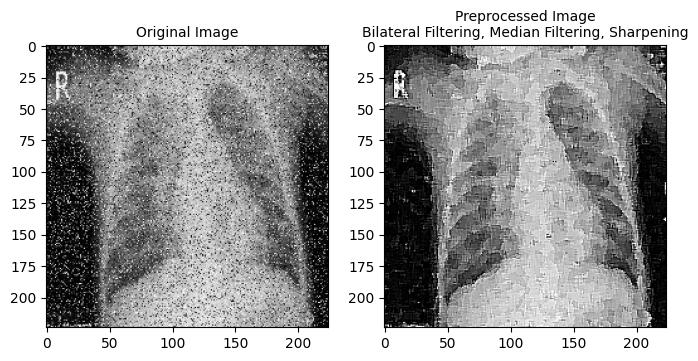

In [ ]:
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True)
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True, sharpen_image=True)

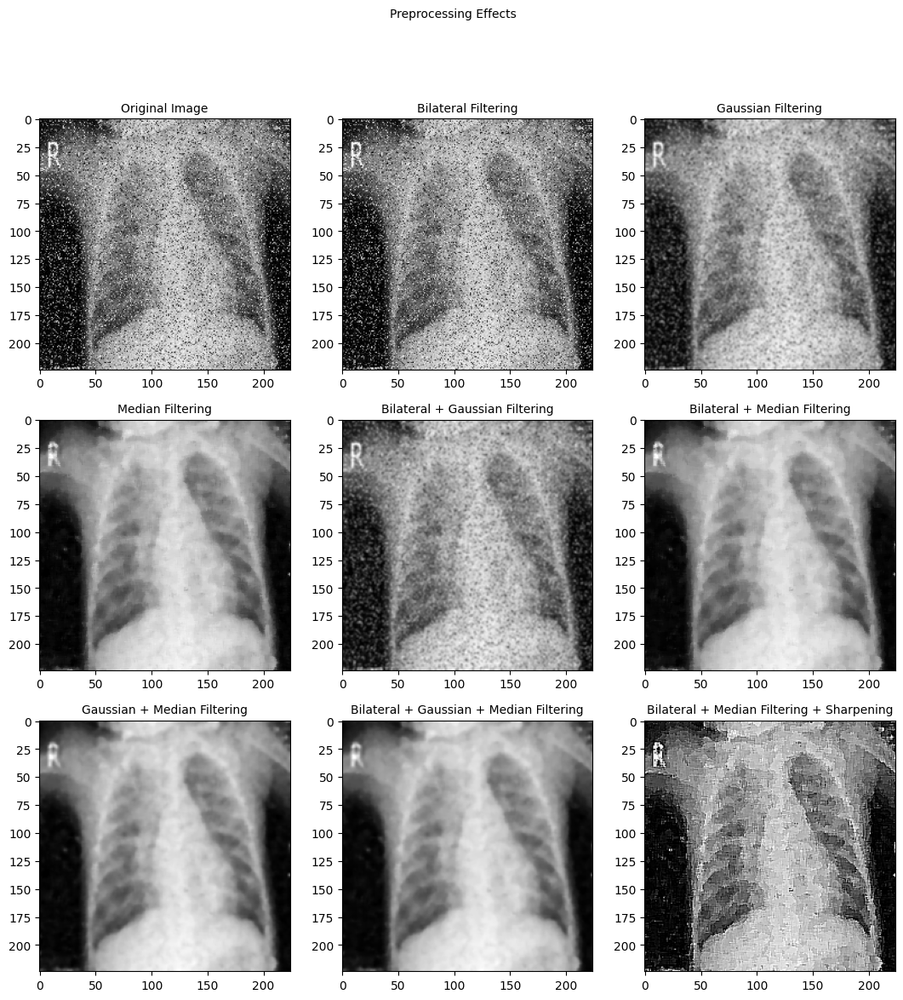

In [ ]:
show_preprocessing_effect(testing_image, figsize=13)

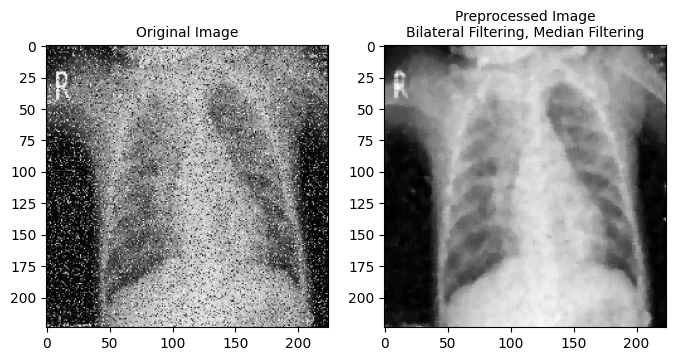

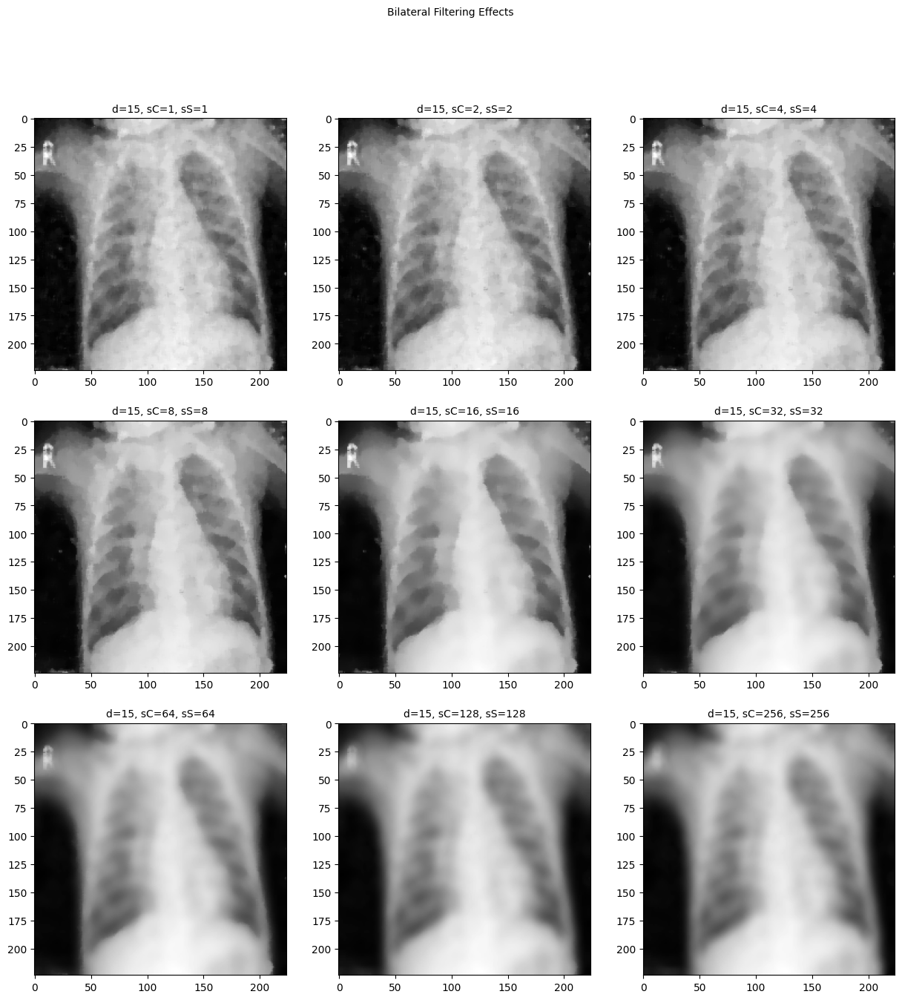

In [ ]:
# Show the effect of different bilateral filter parameters on the same image
show_bilateral_filtering_effect(testing_image, median_filtering=True, fontsize=10, figsize=15)

# Second Image

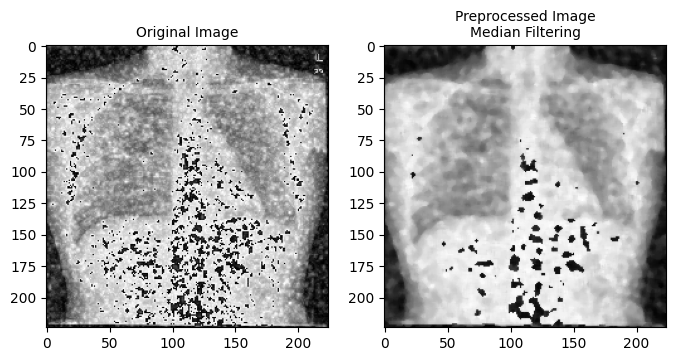

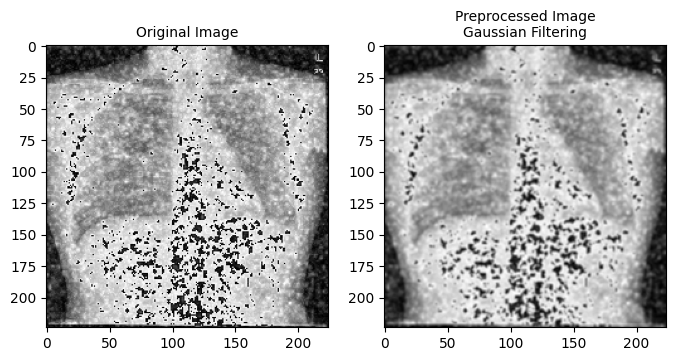

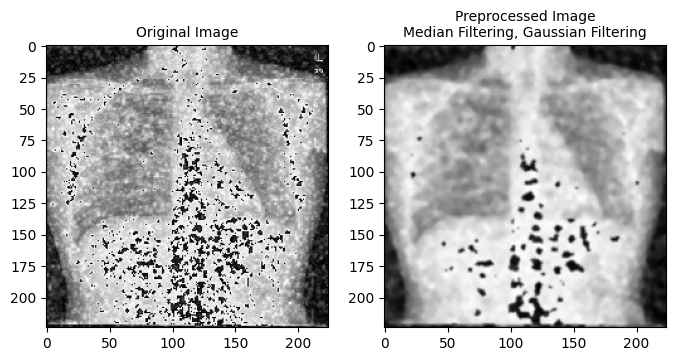

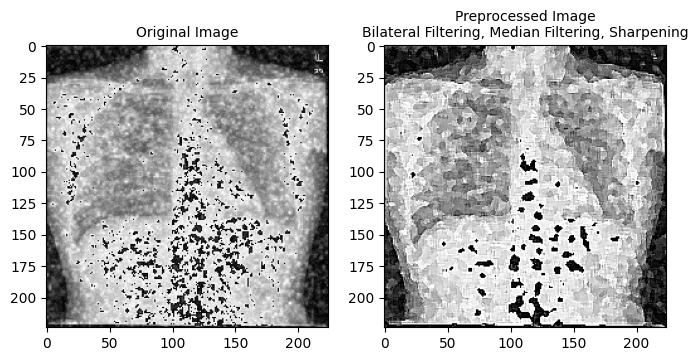

In [ ]:
# Read in the image elimina_subito.jpeg
testing_image = cv2.imread('subito2.png')
# test preprocessing

_=pre_process_image(testing_image, median_filtering= True)
_=pre_process_image(testing_image, gaussian_filtering= True)
_=pre_process_image(testing_image, gaussian_filtering= True, median_filtering= True)
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True, sharpen_image=True)


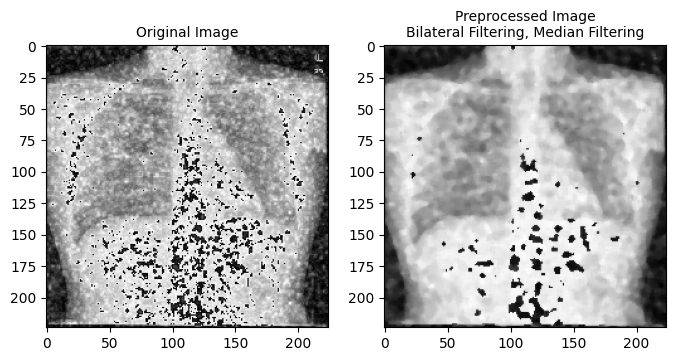

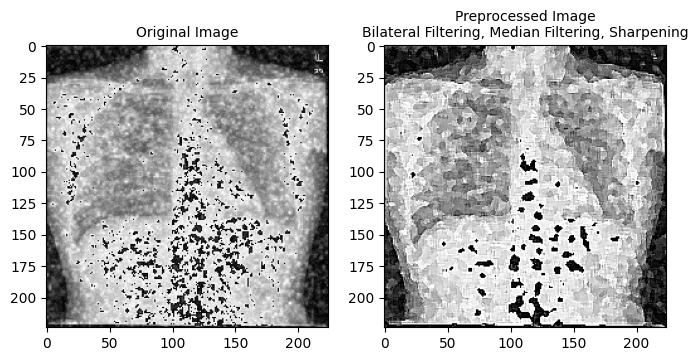

In [ ]:
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True)
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True, sharpen_image=True)

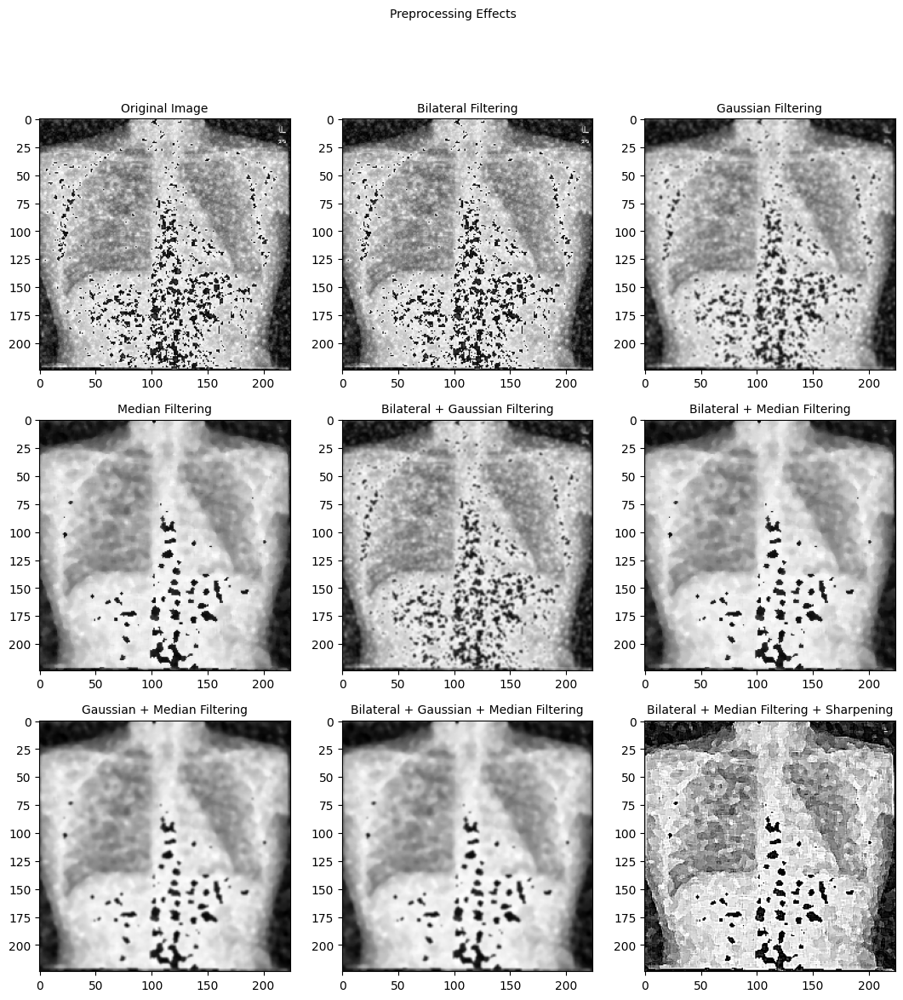

In [ ]:
show_preprocessing_effect(testing_image, figsize=13)

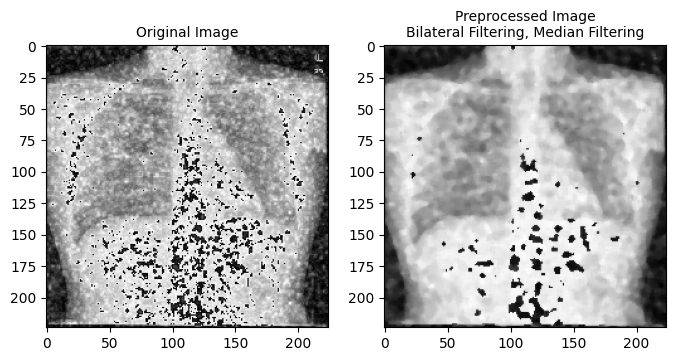

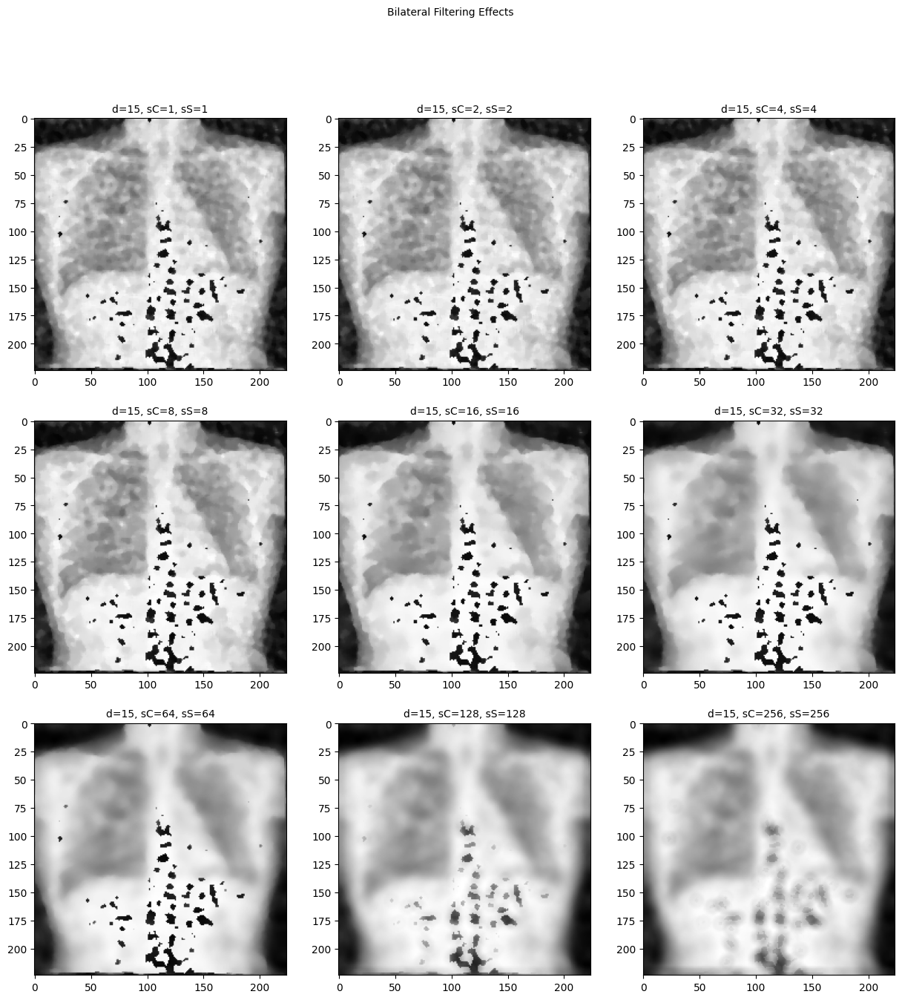

In [ ]:
show_bilateral_filtering_effect(testing_image, median_filtering=True, fontsize=10, figsize=15)

# Third Image

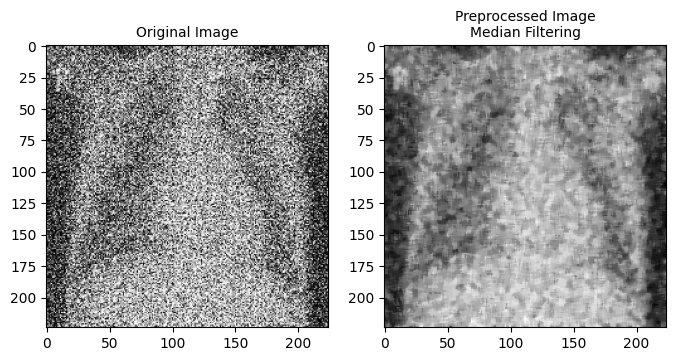

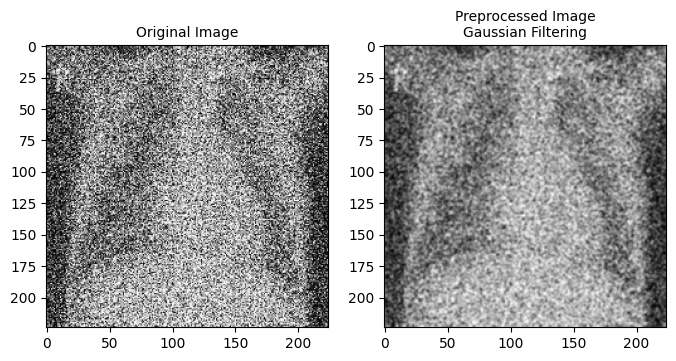

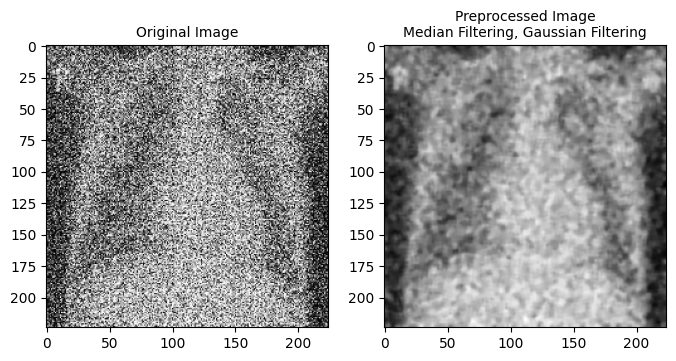

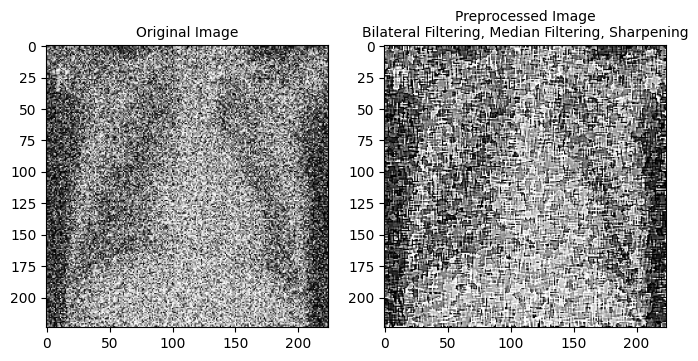

In [ ]:
testing_image = cv2.imread('subito3.jpeg')

_=pre_process_image(testing_image, median_filtering= True) 
_=pre_process_image(testing_image, gaussian_filtering= True)
_=pre_process_image(testing_image, gaussian_filtering= True, median_filtering= True) 
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True, sharpen_image=True)

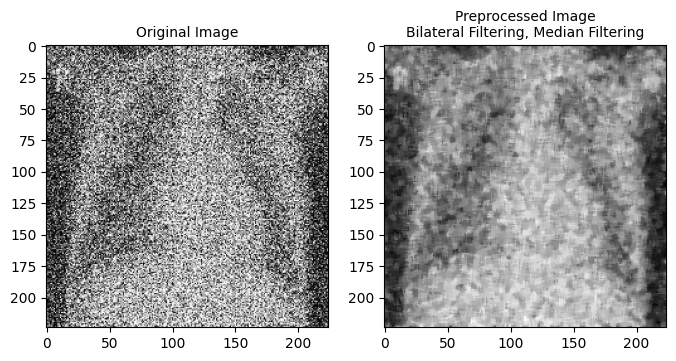

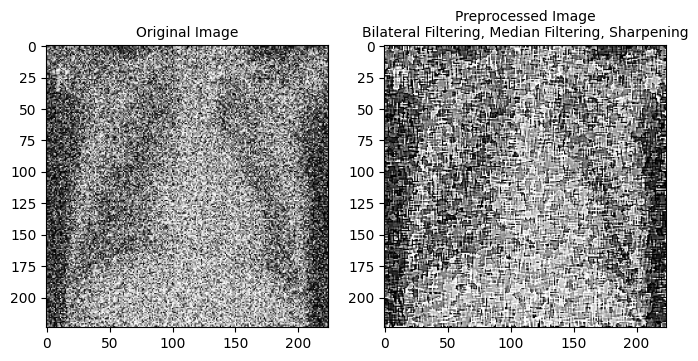

In [ ]:
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True)
_=pre_process_image(testing_image, median_filtering= True, apply_bilateral= True, sharpen_image=True)

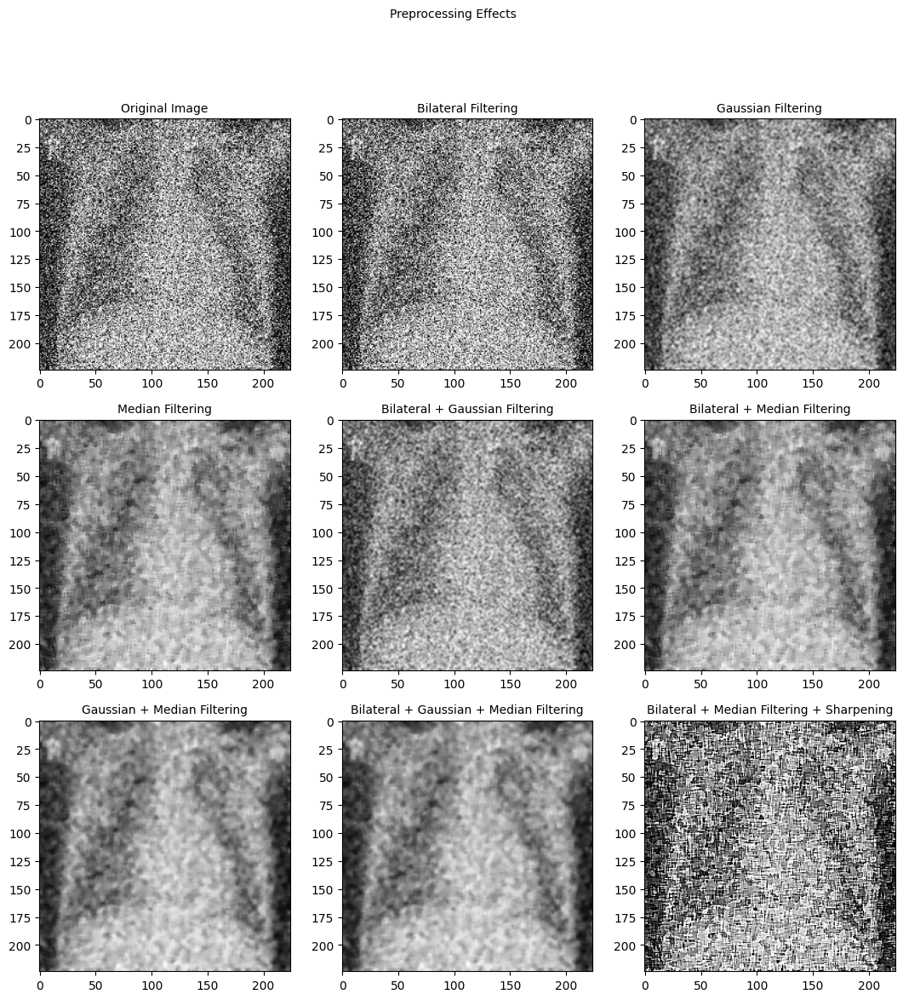

In [ ]:
show_preprocessing_effect(testing_image, figsize=13)

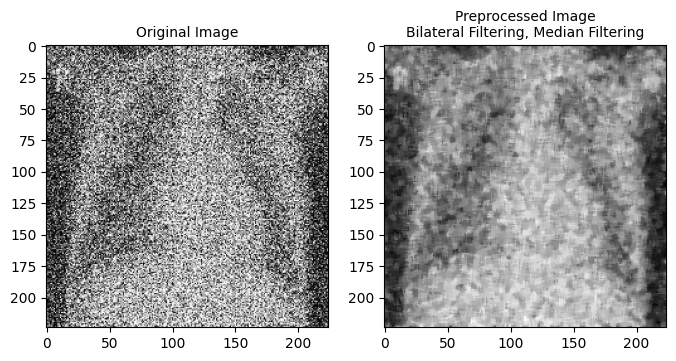

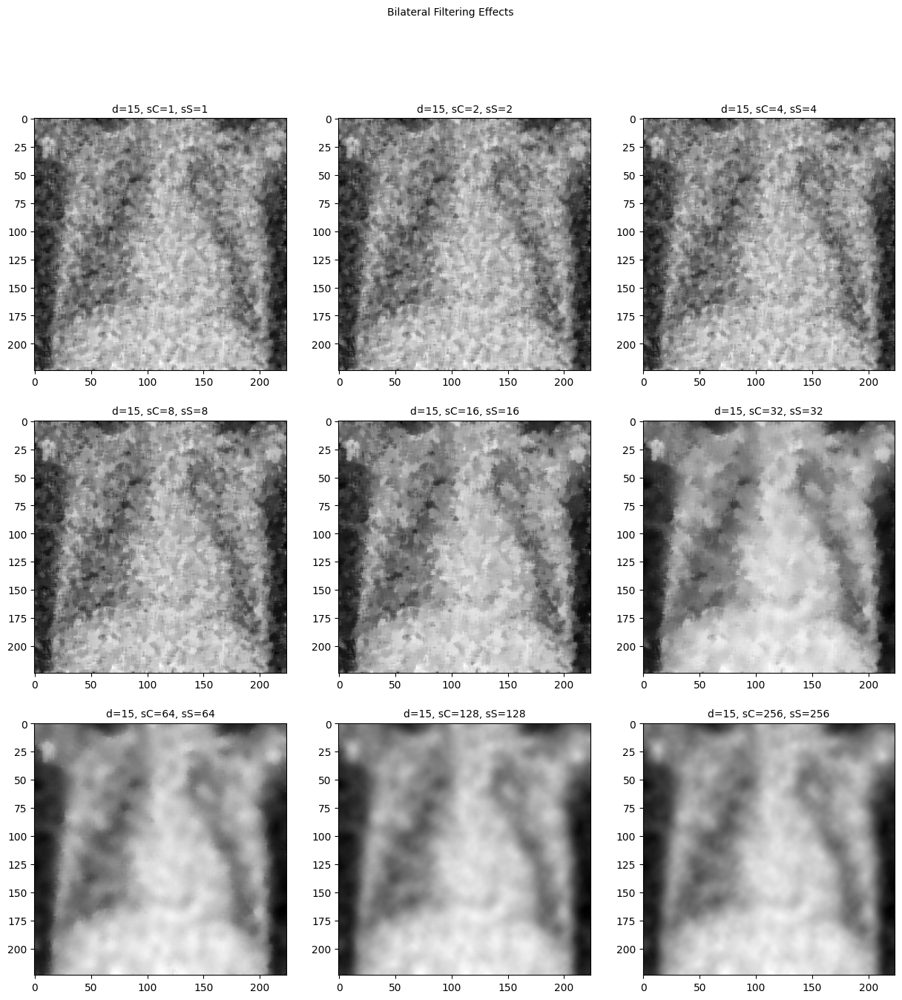

In [ ]:
show_bilateral_filtering_effect(testing_image, median_filtering=True, fontsize=10, figsize=15)